In [1]:
import dynamo as dyn
import scanpy as sc
import matplotlib.pyplot as plt 

import squidpy

import pysal

import cv2

import numpy as np 
import pandas as pd 
%matplotlib inline

### Either use previous processed Zebrafish data or process it in some basis again.


In [2]:
# Change to the result of zebrafish tutorial after fixing saving issue in the previous notebook
# adata = dyn.read_h5ad("zebrafish_tutorial.h5ad")
adata = dyn.sample_data.zebrafish()
dyn.pp.recipe_monocle(adata) # , exprs_frac_max=0.005)
dyn.tl.dynamics(adata, model='stochastic', cores=3) 

|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...
|-----> calculating size factor...
|-----> selecting genes...
|-----> <insert> frac to var in AnnData Object.
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <inse

AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics'
    obsm: 'X_pca', 'X'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con'

In [3]:
dyn.tl.reduceDimension(adata)
dyn.tl.cell_velocities(adata, method='pearson', other_kernels_dict={'transform': 'sqrt'})
# dyn.vf.VectorField(adata, basis='pca', M=1000, pot_curl_div=True) 

|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [19.5723s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [7.3841s]


AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 

Lets use use umap basis for visualization on 2D plots.

<Figure size 400x400 with 0 Axes>

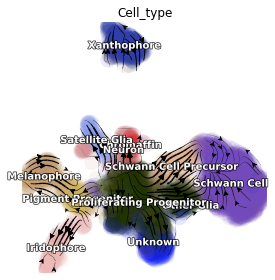

In [4]:
dyn.pl.streamline_plot(adata, color=['Cell_type'], basis='umap', show_legend='on data', 
                       quiver_length=6, quiver_size=6,  show_arrowed_spines=False,
                       figsize=(4, 4))

<Figure size 400x400 with 0 Axes>

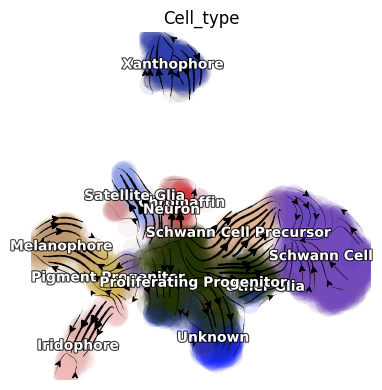

/Users/mashiro/dynamo-release/dynamo/plot/scVectorField.py:1102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 400x400 with 0 Axes>

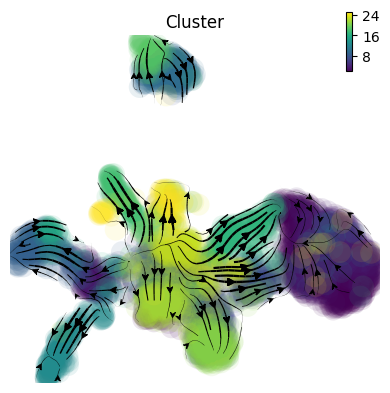

In [5]:
dyn.pl.streamline_plot(adata, color=['Cell_type'], basis='umap', show_legend='on data', 
                       quiver_length=6, quiver_size=6,  show_arrowed_spines=False,
                       figsize=(4, 4)
                      )
dyn.pl.streamline_plot(adata, color=['Cluster'], basis='umap', show_legend='on data', 
                       quiver_length=6, quiver_size=6,  show_arrowed_spines=False,
                       figsize=(4, 4)
                      )

In [6]:
adata.var.use_for_transition.sum()

509

## Vector field analysis
In this part we will go through how to utilize Dynamo to do vector field analysis.
The big picture is to learn the vector field function at first, and then compute Jacobian, acceleration, and curvature information to rank genes across all cells or in each cell group. Finally we do gene enrichment analysis and regulatory network construction with visualization.


Calculate cell velocities in PCA space.

In [7]:
dyn.tl.cell_velocities(adata, basis='pca')

|-----> [projecting velocity vector to low dimensional embedding] in progress: 1.9373%

Using existing pearson_transition_matrix found in .obsp.


|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [10.1039s]


AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap', 'velocity_pca'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M

Here the `dyn.vf.VectorField` function learns a function of high dimensional vector field from sparse single cell samples in the entire space robustly. Learned vector field related information fields are inserted to adata. You can try different methods to learn the vector field by changing the method parameter.

In [8]:
dyn.vf.VectorField(adata, basis='pca', M=100, method = "SparseVFC")

|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> <insert> control_point_pca to obs in AnnData Object.
|-----> <insert> inlier_prob_pca to obs in AnnData Object.
|-----> <insert> obs_vf_angle_pca to obs in AnnData Object.

|-----> [VectorField] finished [0.2112s]


Here we use `dyn.vf.curvature` to calculate curvature for each cell with the reconstructed vector field function stored in adata. `dyn.vf.rank_curvature_genes` ranks genes based on their absolute curvature values in different cell groups.

In [9]:
dyn.vf.curvature(adata, basis='pca')

|-----> [Calculating acceleration] in progress: 100.0000%
|-----> [Calculating acceleration] finished [5.7679s]
|-----> [Calculating curvature] in progress: 100.0000%
|-----> [Calculating curvature] finished [5.3426s]


In [10]:
dyn.vf.rank_curvature_genes(adata, groups='Cell_type')

AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'curvature_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca', 'rank_curvature', 'rank_abs_curvature'
    obsm: 'X_pca', 'X',

`dyn.vf.acceleration` is used here to compute acceleration for each cell with the learned vector field in adata. Note that we use PCA basis to calculate acceleration, but `dyn.vf.acceleration` will project acceleration_pca back to high dimension version for each gene. You can check the resulted adata having both acceleration and acceleration_pca. We then rank acceleration in the same fashion as what we did to curvature.

In [11]:
dyn.vf.acceleration(adata, basis='pca')

|-----> [Calculating acceleration] in progress: 100.0000%
|-----> [Calculating acceleration] finished [5.4250s]


In [12]:
dyn.vf.rank_acceleration_genes(adata, groups='Cell_type')

AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'curvature_pca', 'acceleration_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca', 'rank_curvature', 'rank_abs_curvature', 'r

Use `dyn.pp.top_pca_genes` to calculate "top_pca_genes" for adata, according to PCs in `adata.uns`.

In [13]:
dyn.pp.top_pca_genes(adata)

466 top PCA genes found for 30 PCs.


AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'curvature_pca', 'acceleration_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition', 'top_pca_genes'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca', 'rank_curvature', 'rank_a

In [14]:
top_pca_genes = adata.var.index[adata.var.top_pca_genes]
print(top_pca_genes)
print(len(top_pca_genes))

Index(['tmsb4x', 'rplp2l', 'pvalb1', 'gfap', 'ptmab', 'cotl1', 'rpl37',
       'fosab', 'nfkbiab', 'si:dkey-183i3.5',
       ...
       'fam212aa', 'ponzr1', 'atp1a3b', 'prph', 'si:ch211-256m1.8', 'sytl2b',
       'ccna2', 'ddc', 'top2a', 'slc6a2'],
      dtype='object', length=466)
466


Here we calculate Jacobian for each cell with the reconstructed vector field. If we use some kind of reduced dimension such as PCA space, `dyn.vf.jacobian` will project the low dimension Jacobian results back to high dimension as we can check in the resulted adata object.

In [15]:
dyn.vf.jacobian(adata, regulators=top_pca_genes, effectors=top_pca_genes)

/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Transforming subset Jacobian: 100%|██████████| 4181/4181 [00:21<00:00, 193.64it/s]


AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'curvature_pca', 'acceleration_pca', 'jacobian_det_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition', 'top_pca_genes'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca', 'rank

Rank genes based on their diagonal Jacobian for each cell group. The "divergence" we are talking about here is basically the diagonal elements of the Jacobian, i.e. the self-activation\inhibition terms. The results are stored in `adata.uns['rank_div_gene_jacobian_pca']`.  
Run `dyn.vf.jacobian` before using this function.

In [16]:
divergence_rank = dyn.vf.rank_divergence_genes(adata, groups='Cell_type')

We can check the result of `dyn.vf.rank_divergence_genes`

In [17]:
divergence_rank.head(10)

,Chromaffin,Iridophore,Melanophore,Neuron,Other Glia,Pigment Progenitor,Proliferating Progenitor,Satellite Glia,Schwann Cell,Schwann Cell Precursor,Unknown,Xanthophore
0,mbpb,tyrp1b,fosb,si:ch211-251b21.1,plp1b,tyrp1b,mbpb,si:ch211-222l21.1,plp1b,plp1b,mbpb,sdc4
1,cldn19,pmela,tspan36,gfap,gfap,pmela,mbpa,ptmab,mpz,mbpa,mbpa,mt2
2,mbpa,si:ch211-222l21.1,pnp4a,cldn19,tyrp1b,pnp4a,cldn19,si:ch211-251b21.1,pnp4a,pnp4a,cldn19,pnp4a
3,pnp4a,mt2,fhl2a,pnp4a,pnp4a,fhl2a,si:ch211-251b21.1,pnp4a,gfap,tyrp1b,pnp4a,tspan36
4,si:ch211-251b21.1,wu:fc46h12,wu:fc46h12,mt2,anxa13l,mt2,pnp4a,fhl2a,tyrp1b,fhl2a,mt2,fhl2a
5,fhl2a,cldn19,mdka,si:ch211-222l21.1,pmela,lgals2a,mt2,mcl1b,si:ch211-251b21.1,pmela,fstl3,cd63
6,tyrp1b,gch2,lgals2a,fhl2a,mpz,CRIP2,tyrp1b,gfap,pmela,gfap,fhl2a,rpl37
7,mt2,gfap,CRIP2,mdkb,mdkb,si:ch211-251b21.1,fhl2a,pmp22a,fhl2a,si:ch211-251b21.1,tyrp1b,slc22a7a
8,gfap,mdkb,si:dkey-21a6.5,ptmab,fhl2a,cldn19,si:ch211-222l21.1,mdka,mdkb,myo1cb,lgals2a,si:ch211-222l21.1
9,si:ch211-222l21.1,MREG,klf6a,grasp,atp1b4,gfap,entpd1,cldn19,atp1b4,CRIP2,CRIP2,cmtm6


We can also rank all other elements in the Jacobian. There are 5 parameters we provide in `dyn.vf.rank_jacobian_genes`'s argument list to rank the Jacobian:

* "full reg": top regulators are ranked for each effector for each cell group

* "full eff": top effectors are ranked for each regulator for each cell group

* "reg": top regulators in each cell group

* "eff": top effectors in each cell group

* "int": top effector-regulator pairs in each cell group

Note that the default mode is "full reg".

In [18]:
full_reg_rank = dyn.vf.rank_jacobian_genes(adata, groups='Cell_type', mode="full reg", abs=True, output_values=True)

rank = full_reg_rank[list(full_reg_rank.keys())[0]]

In [19]:
full_eff_rank = dyn.vf.rank_jacobian_genes(adata, groups='Cell_type', mode='full eff', abs=True, exclude_diagonal=True, output_values=True)

In [20]:
eff_rank = dyn.vf.rank_jacobian_genes(adata, groups='Cell_type', mode='eff', abs=True, output_values=True)

In [21]:
reg_rank = dyn.vf.rank_jacobian_genes(adata, groups='Cell_type', mode='reg', abs=True, exclude_diagonal=True)

In [22]:
int_rank = dyn.vf.rank_jacobian_genes(adata, groups='Cell_type', mode='int', exclude_diagonal=True, output_values=True)

Save results to the current workspace.

In [23]:
import pickle
pickle.dump(adata.uns['rank_acceleration'], open('./zebrafish_vf_rank_acceleration.p', 'wb'))
pickle.dump(adata.uns['rank_curvature'], open('./zebrafish_vf_rank_curvature.p', 'wb'))

pickle.dump(adata.uns['rank_abs_acceleration'], open('./zebrafish_vf_rank_abs_acceleration.p', 'wb'))
pickle.dump(adata.uns['rank_abs_curvature'], open('./zebrafish_vf_rank_abs_curvature.p', 'wb'))

adata.uns['rank_acceleration'].to_csv('zebrafish_vf_rank_acceleration.csv')
adata.uns['rank_curvature'].to_csv('zebrafish_vf_rank_curvature.csv')
adata.uns['rank_abs_acceleration'].to_csv('zebrafish_vf_rank_abs_acceleration.csv')
adata.uns['rank_abs_curvature'].to_csv('zebrafish_vf_rank_abs_curvature.csv')

pickle.dump(divergence_rank, open('./zebrafish_vf_divergence_rank.p', 'wb'))

pickle.dump(full_reg_rank, open('./zebrafish_vf_full_reg_rank.p', 'wb'))
pickle.dump(full_eff_rank, open('./zebrafish_vf_full_eff_rank.p', 'wb'))
pickle.dump(rank, open('./zebrafish_vf_rank.p', 'wb'))
pickle.dump(eff_rank, open('./zebrafish_vf_eff_rank.p', 'wb'))
pickle.dump(reg_rank, open('./zebrafish_vf_reg_rank.p', 'wb'))
pickle.dump(int_rank, open('./zebrafish_vf_int_rank.p', 'wb'))

pickle.dump(divergence_rank, open('./zebrafish_vf_divergence_rank.p', 'wb'))

pickle.dump(full_reg_rank, open('./zebrafish_vf_full_reg_rank.p', 'wb'))
pickle.dump(full_eff_rank, open('./zebrafish_vf_full_eff_rank.p', 'wb'))
pickle.dump(rank, open('./zebrafish_vf_rank.p', 'wb'))
pickle.dump(eff_rank, open('./zebrafish_vf_eff_rank.p', 'wb'))
pickle.dump(reg_rank, open('./zebrafish_vf_reg_rank.p', 'wb'))
pickle.dump(int_rank, open('./zebrafish_vf_int_rank.p', 'wb'))

In [24]:
int_rank = pickle.load(open('./zebrafish_vf_int_rank.p', 'rb'))
reg_rank = pickle.load(open('./zebrafish_vf_reg_rank.p', 'rb'))

-----------TODO: REFINE TUTORIAL CODE&EXPLANATION PART BELOW-----------

In [25]:
# int_rank.head(50)
print(type(rank))
print(type(full_eff_rank))
print(type(int_rank))
print(type(reg_rank))
reg_rank

<class 'pandas.core.frame.DataFrame'>
<class 'dict'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


,Schwann Cell,Unknown,Neuron,Satellite Glia,Melanophore,Iridophore,Schwann Cell Precursor,Proliferating Progenitor,Xanthophore,Pigment Progenitor,Chromaffin,Other Glia
0,fosab,fosab,hmgn2,fosab,fosab,pnp4a,fosab,mbpb,fosab,mt2,hmgn2,fosab
1,mt2,phlda2,tuba8l3,si:ch211-222l21.1,crip1,phlda2,hmgn2,mbpa,efna1b,tyrp1b,hmgb2a,mt2
2,krt18,mbpb,mbpa,mt2,fosb,si:ch211-222l21.1,tuba8l3,fosab,rgcc,pnp4a,pcna,hmgb2a
3,si:ch211-156j16.1,mbpa,fosab,mbpa,si:ch211-39i22.1,lgals2a,mbpb,hmgn2,mt2,si:ch211-222l21.1,mbpb,tuba8l4
4,mbpa,si:dkey-183i3.5,mbpb,hmgn2,sox4a,fhl2a,mbpa,hmgb2a,fstl3,pmela,tuba8l4,si:ch211-156j16.1
...,...,...,...,...,...,...,...,...,...,...,...,...
461,maptb,rab6ba,pah,tspan10,slc16a1a,rab6ba,pah,igfbp2a,slc6a2,ebf3a,ston2,tcirg1a
462,olfm1b,slc6a2,tcf3b,pah,rab6ba,slc6a2,ddc,pah,ngfrb,gnmt,igfbp2a,maptb
463,ebf3a,slc16a1a,col14a1a,slc22a2,SHROOM2,tspan15,slc6a2,gnmt,maptb,slc16a1a,slc16a1a,rab6ba
464,rab6ba,phyhd1,slc16a1a,gnmt,ebf3a,si:dkeyp-120h9.1,ebf3a,slc16a1a,col14a1a,atp1a3b,atp1a3b,rdh5


Now we can check the top regulators for each marker gene in each cell type. This is the same when the ranking results  is based on full ranking (`full reg` or `full eff`)  
Here again we can choose a few genes from figure 3 (si 5) of Saunders, et al (2019) to see their expression dynamics over time. 

In [26]:
fig3_si5 = ['mitfa', 'pax3a', 'tfec', 'dct', 'alx4b', 'tyrp1b', 'gpnmb', 'pmela', 'pnp4a']
# selected_genes = adata.var_names
selected_genes = top_pca_genes[:10]
# selected_genes = fig3_si5
print("selected genes:", selected_genes)

selected genes: Index(['tmsb4x', 'rplp2l', 'pvalb1', 'gfap', 'ptmab', 'cotl1', 'rpl37',
       'fosab', 'nfkbiab', 'si:dkey-183i3.5'],
      dtype='object')


In [27]:
rank.columns.intersection(selected_genes)

Index(['tmsb4x', 'rplp2l', 'pvalb1', 'gfap', 'ptmab', 'cotl1', 'rpl37',
       'fosab', 'nfkbiab', 'si:dkey-183i3.5'],
      dtype='object')

### Build Regulatory Network

In [28]:
edges_list = dyn.vf.build_network_per_cluster(adata,
                                              cluster='Cell_type',
                                              cluster_names=None,
                                              full_reg_rank=full_reg_rank,
                                              full_eff_rank=full_eff_rank,
                                              genes=selected_genes,
                                              n_top_genes=100)

import networkx as nx


/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[16, 19, 17, 15, 20, 20, 19, 17, 16, 17]


<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


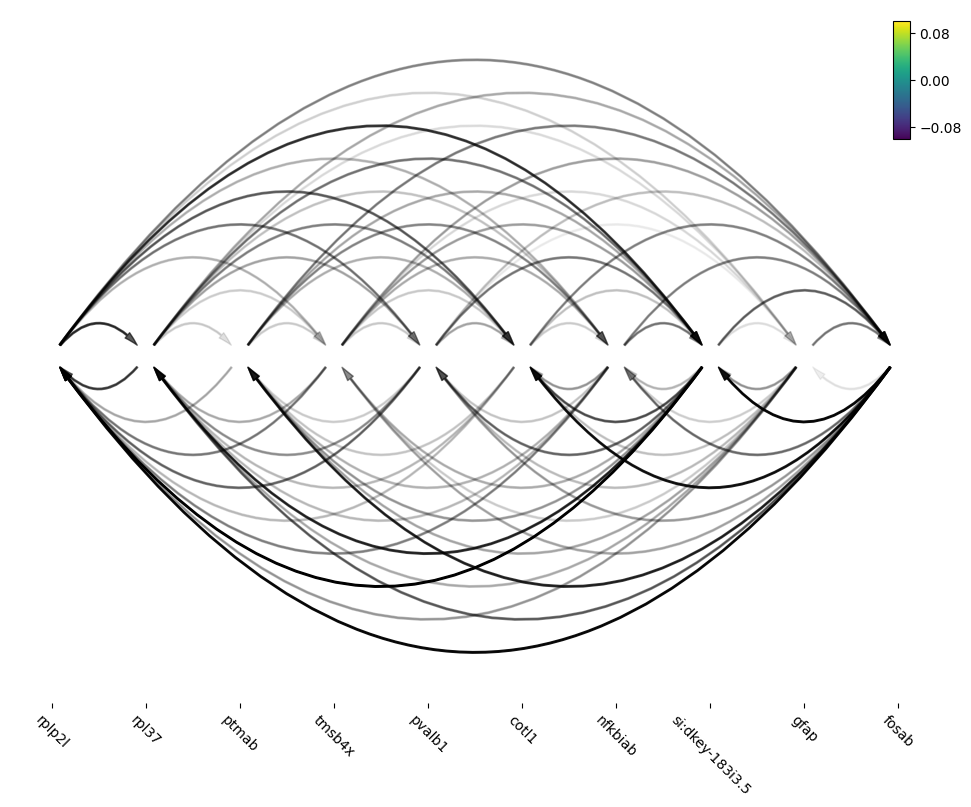

[13, 14, 16, 18, 20, 19, 18, 15, 14, 15]


<Figure size 640x480 with 0 Axes>

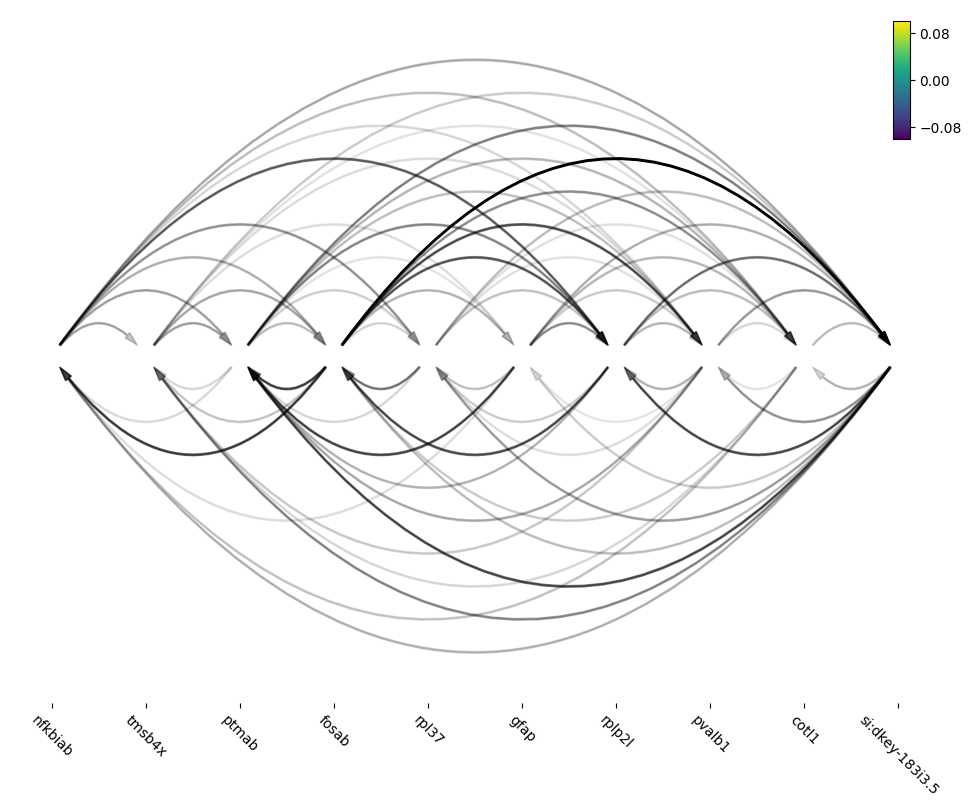

[15, 16, 19, 17, 20, 19, 20, 18, 18, 14]


<Figure size 640x480 with 0 Axes>

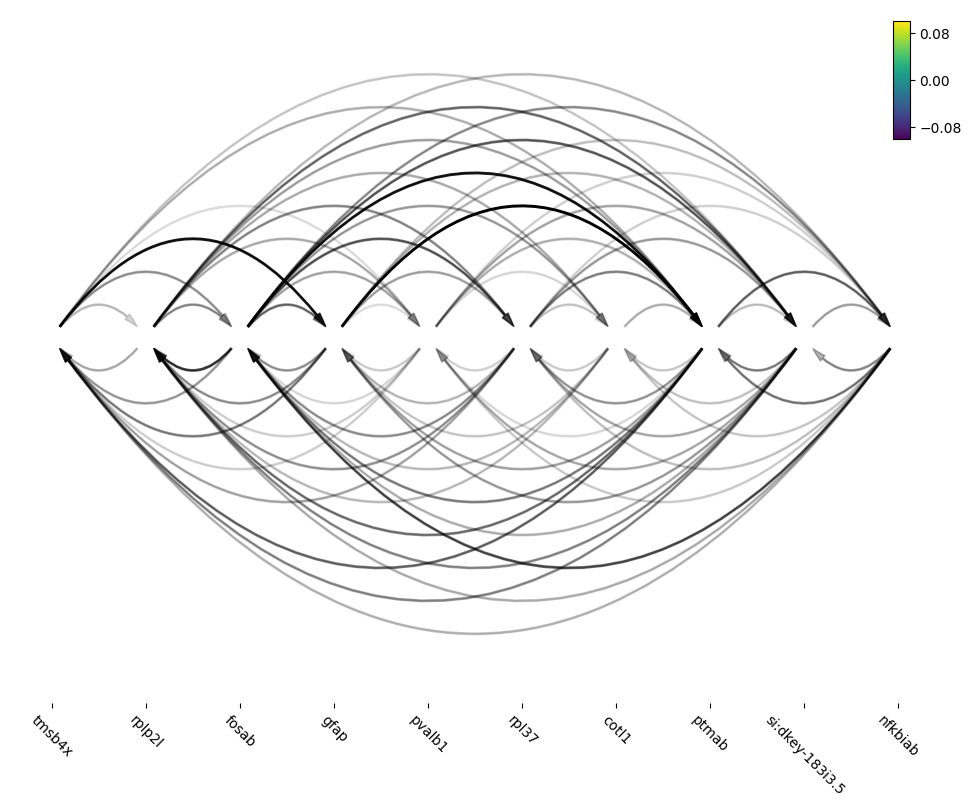

[17, 16, 20, 20, 18, 18, 20, 19, 18, 18]


<Figure size 640x480 with 0 Axes>

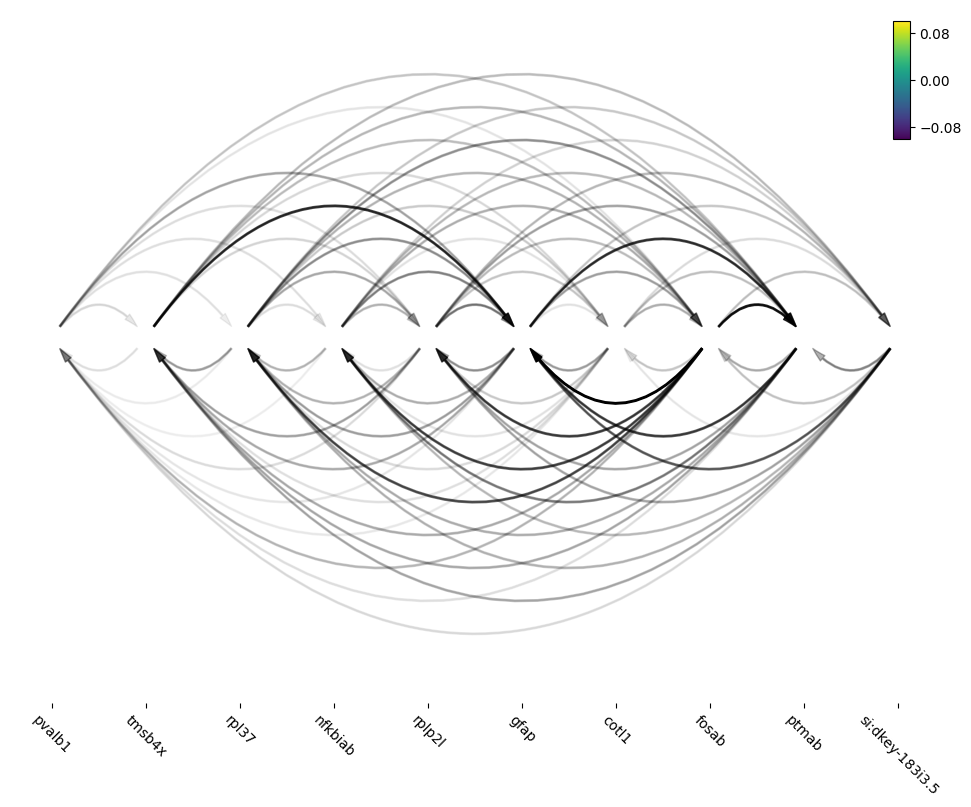

[17, 16, 18, 18, 19, 19, 18, 18, 17, 12]


<Figure size 640x480 with 0 Axes>

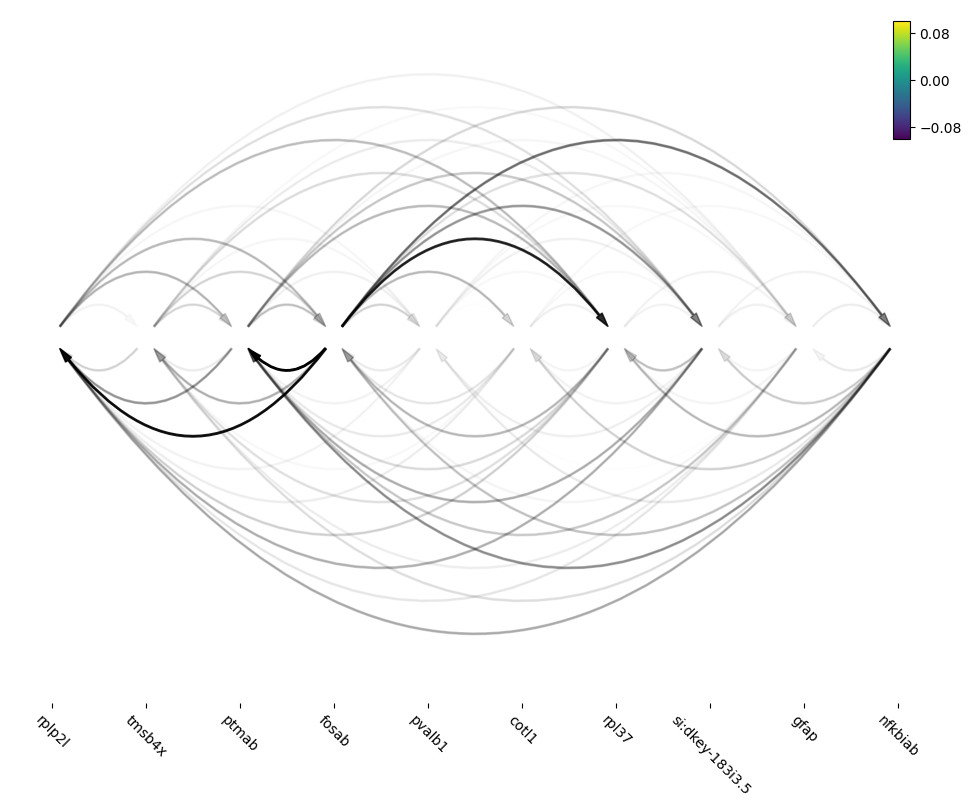

[18, 18, 11, 18, 19, 16, 17, 16, 13, 18]


<Figure size 640x480 with 0 Axes>

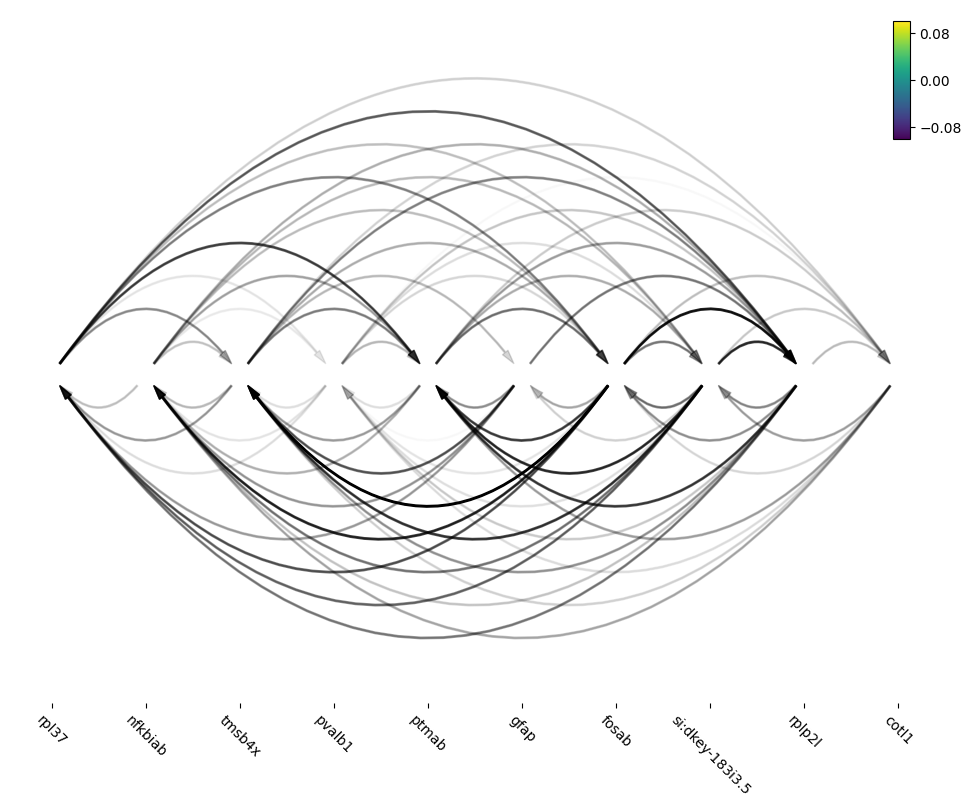

[16, 17, 19, 19, 20, 19, 20, 17, 16, 19]


<Figure size 640x480 with 0 Axes>

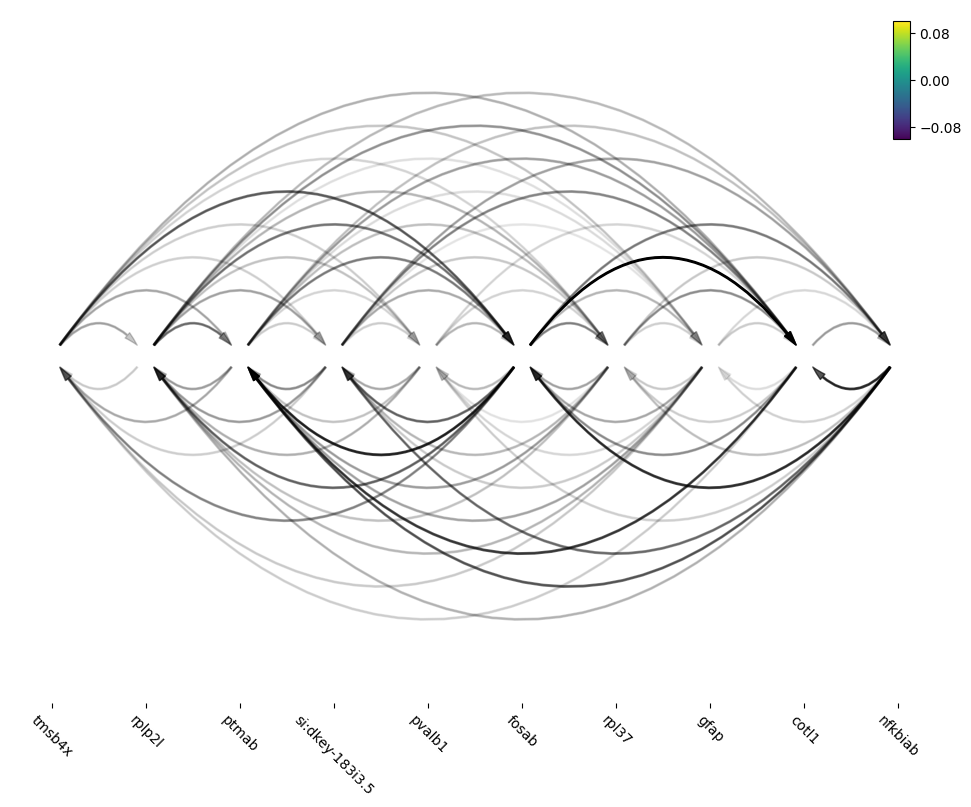

[14, 16, 17, 17, 11, 18, 18, 18, 13, 12]


<Figure size 640x480 with 0 Axes>

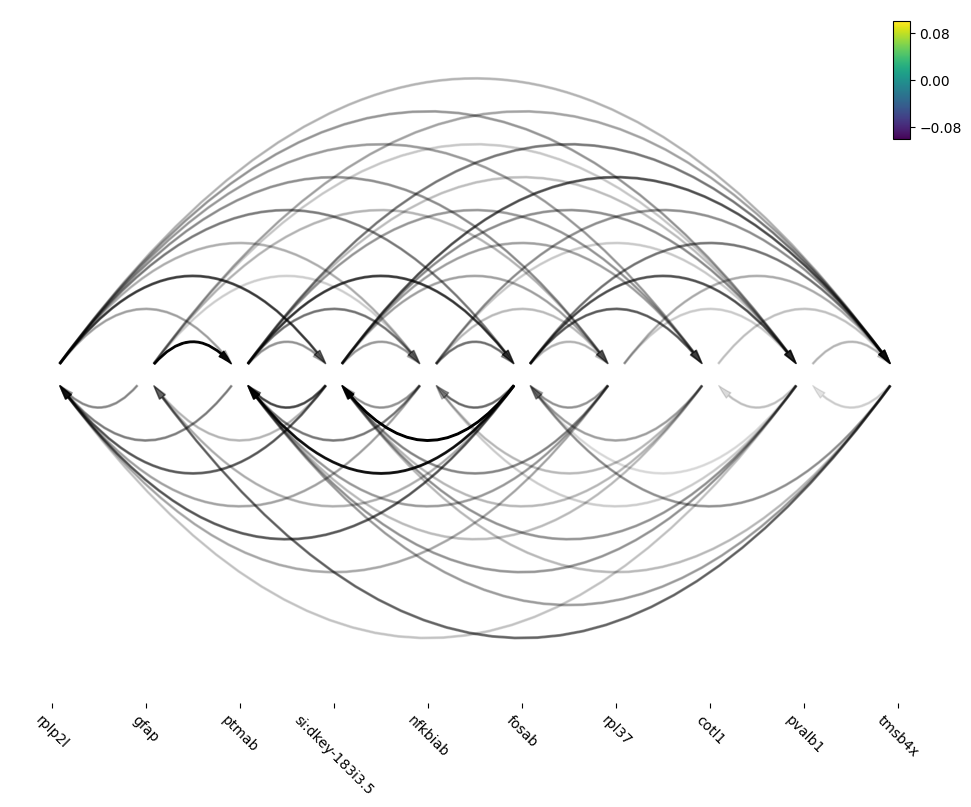

[19, 18, 18, 19, 20, 20, 20, 19, 17, 18]


<Figure size 640x480 with 0 Axes>

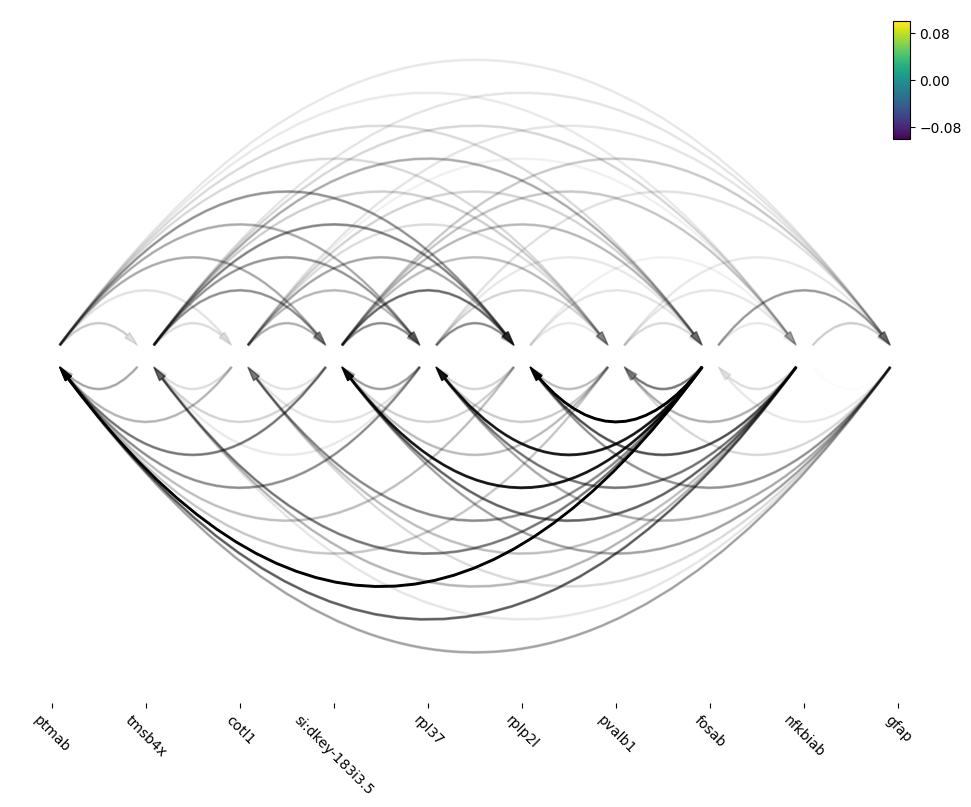

[14, 18, 12, 17, 17, 19, 13, 15, 14, 11]


<Figure size 640x480 with 0 Axes>

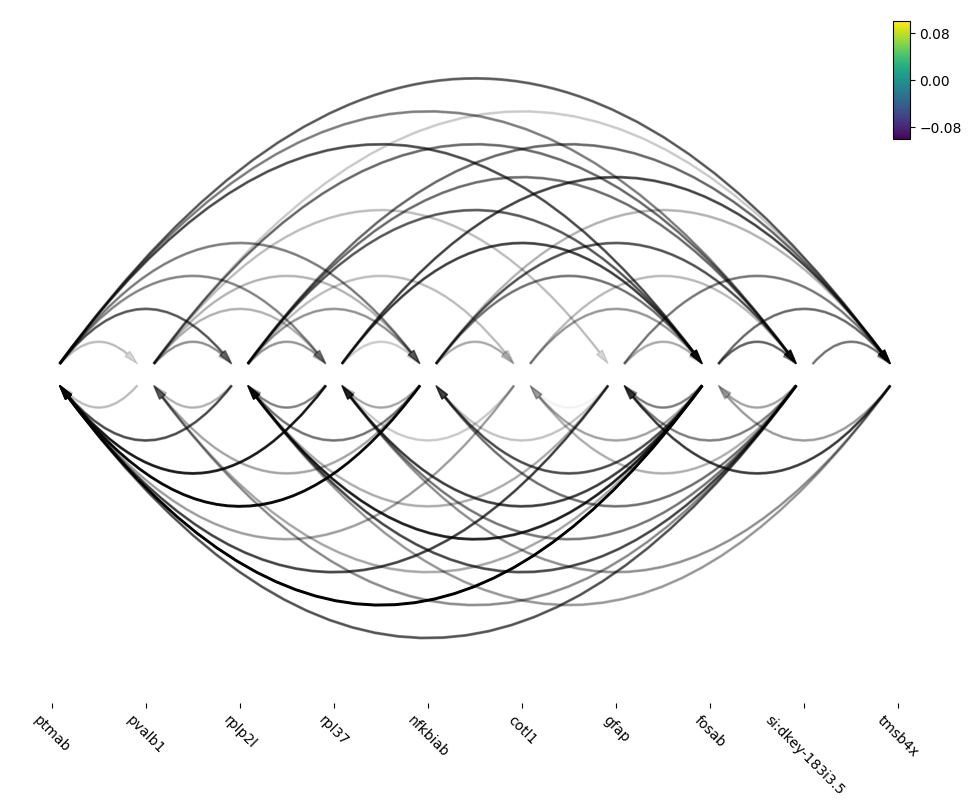

[14, 13, 13, 18, 17, 20, 19, 10, 15, 15]


<Figure size 640x480 with 0 Axes>

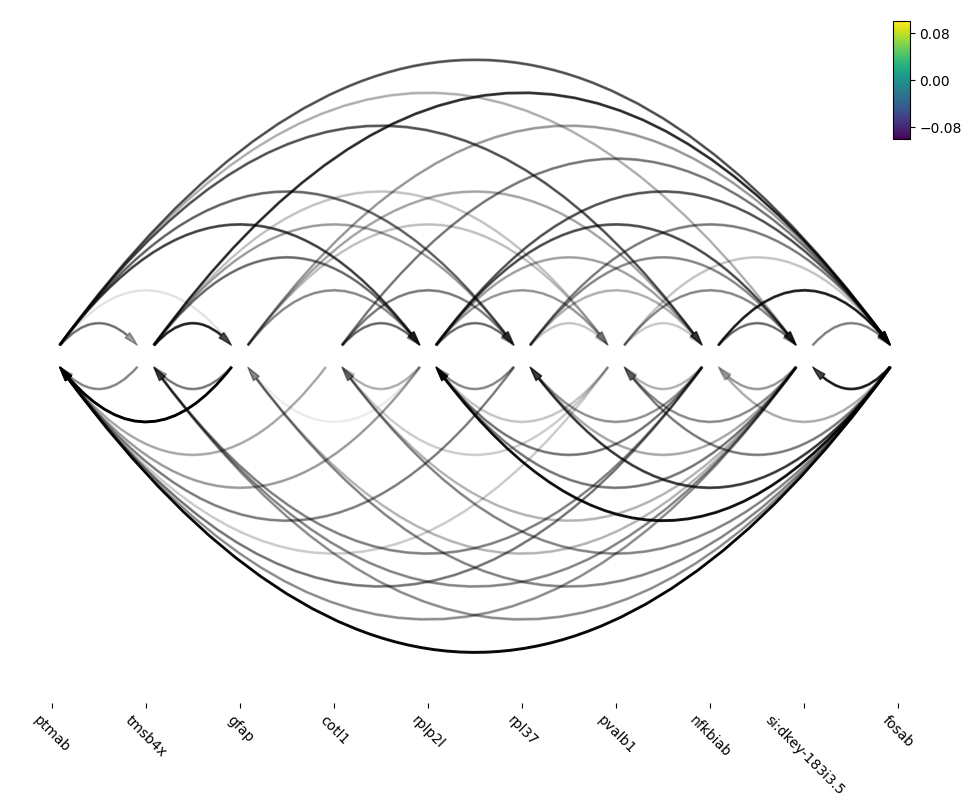

[15, 14, 16, 15, 18, 18, 17, 18, 15, 10]


<Figure size 640x480 with 0 Axes>

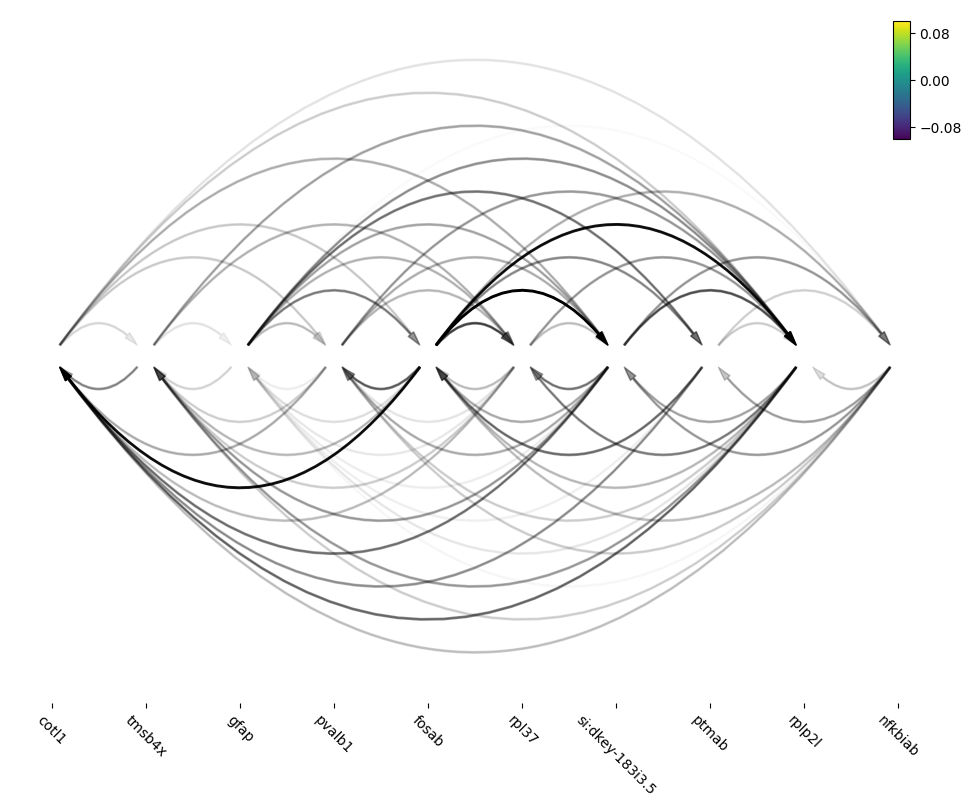

<Figure size 640x480 with 0 Axes>

In [29]:
for i, name in enumerate(edges_list):
    network = nx.from_pandas_edgelist(edges_list[name].drop_duplicates().query("weight > 1e-5"), 'regulator', 'target', edge_attr='weight', create_using=nx.DiGraph())
    ax=dyn.pl.arcPlot(adata, cluster="Cell_type", cluster_name="base", edges_list=None, network=network, color="M_s", figsize=(12, 9), save_show_or_return='show')
    plt.savefig('./Cell_type_' + str(i) + '.pdf')

index
TGCCAAATCACCACCT-1-0                Schwann Cell
AAATGCCAGGAGCGTT-1-0                     Unknown
CAGCGACAGAGAACAG-1-0                Schwann Cell
GGGACCTGTGACCAAG-1-0                     Unknown
TCCCGATAGTGTGGCA-1-0                Schwann Cell
                                  ...           
TAGACCAAGTCCATAC-1-1                  Chromaffin
GGTGTTAAGGAATCGC-1-1                 Xanthophore
CTACCCAAGTGACATA-1-1    Proliferating Progenitor
TACTCATGTTACGCGC-1-1    Proliferating Progenitor
TCAACGACACTCTGTC-1-1                      Neuron
Name: Cell_type, Length: 4181, dtype: category
Categories (12, object): ['Chromaffin', 'Iridophore', 'Melanophore', 'Neuron', ..., 'Schwann Cell', 'Schwann Cell Precursor', 'Unknown', 'Xanthophore']


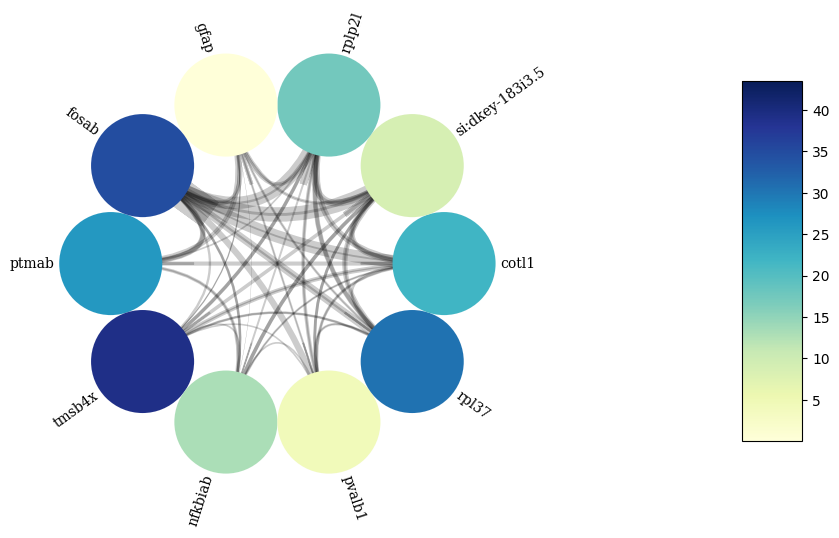

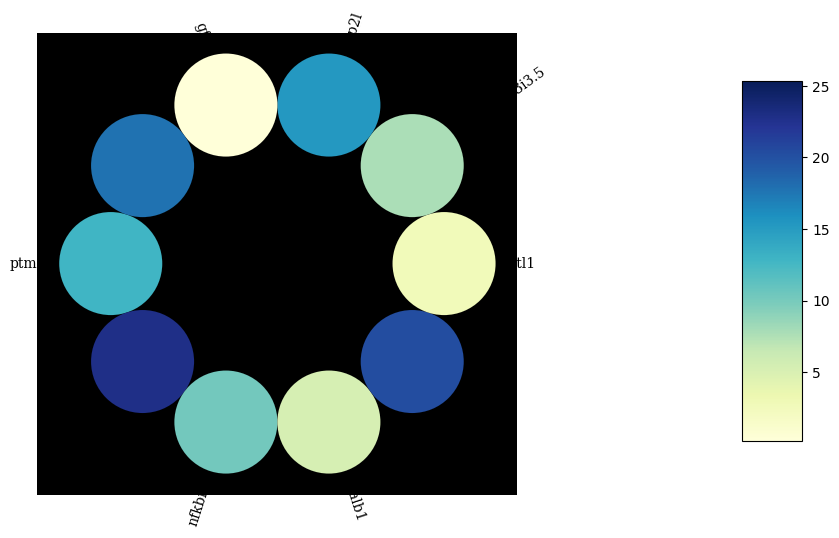

In [30]:
print(adata.obs.Cell_type)
dyn.pl.circosPlot(adata, cluster="Cell_type", cluster_name="Schwann Cell", edges_list=None, 
                  network=network, color="M_s", )
dyn.pl.circosPlot(adata, cluster="Cell_type", cluster_name="Unknown", edges_list=None, 
                  network=network, color="M_s", )

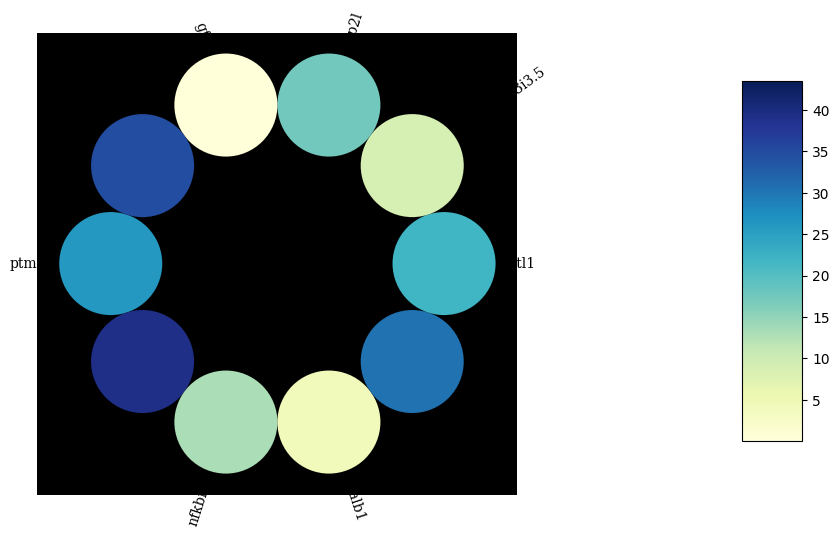

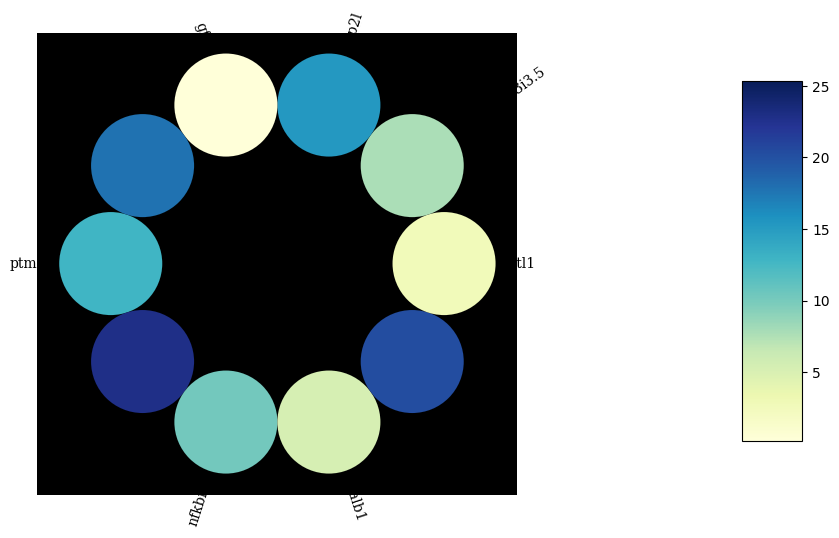

In [31]:
dyn.pl.circosPlot(adata, cluster="Cell_type", cluster_name="Schwann Cell", edges_list=None, 
                  network=network, color="M_s", )
dyn.pl.circosPlot(adata, cluster="Cell_type", cluster_name="Unknown", edges_list=None, 
                  network=network, color="M_s", )

In [32]:
rank_acceleration = adata.uns['rank_acceleration']
np.unique(rank_acceleration.head(25).values)

array(['KRT', 'MREG', 'RPL41', 'aatkb', 'ahnak', 'ak1', 'anxa4',
       'aqp1a.1', 'arl6ip1', 'atf3', 'bzw1a', 'cadm4', 'calm1a', 'calm2a',
       'calm2b', 'ccna2', 'cd63', 'cd81a', 'cd9b', 'cdk1', 'cdkn1bb',
       'cfl1', 'cirbpa', 'cldn19', 'col4a1', 'cotl1', 'crip1', 'dct',
       'dynll1', 'egr2b', 'elovl1a', 'elovl1b', 'entpd1', 'entpd3',
       'fabp3', 'fosab', 'fosb', 'foxp4', 'fxyd1', 'gch2', 'gldn',
       'gpr143', 'grasp', 'gstp1', 'h2afvb', 'h3f3b.1', 'hmga1a',
       'hmgb1a', 'hmgb2a', 'hmgn2', 'itm2ba', 'klf6a', 'krt18', 'lbr',
       'lgals2a', 'lrrc17', 'mbpa', 'mbpb', 'mcl1a', 'mcl1b', 'mdh1aa',
       'mdka', 'mki67', 'mlpha', 'mmp17b', 'mt2', 'myo1cb', 'nfkbiab',
       'ngfrb', 'oca2', 'p4hb', 'pcna', 'pfn2', 'phlda2', 'plp1b',
       'pmela', 'pmp22a', 'pmp22b', 'pnp4a', 'pnp5a', 'ptmaa', 'ptmab',
       'qdpra', 'qki2', 'qkia', 'rap1b', 'rasgef1ba', 'rbm24a', 'rgcc',
       'rpl36a', 'rpl37', 'rplp1', 'rplp2l', 'rrm2', 'rtn1b', 'sb:cb81',
       'scn4ab', 'sdc

In [33]:
edges_list[list(edges_list.keys())[0]]
edge_list = edges_list[list(edges_list.keys())[0]]

/Users/mashiro/dynamo-release/dynamo/plot/vector_calculus.py:539: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


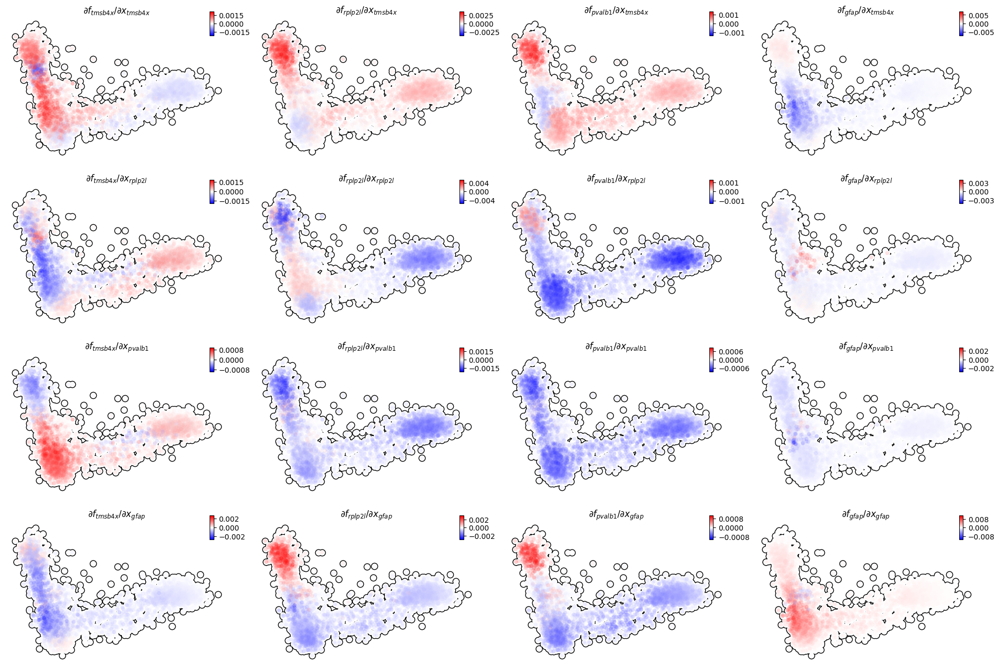

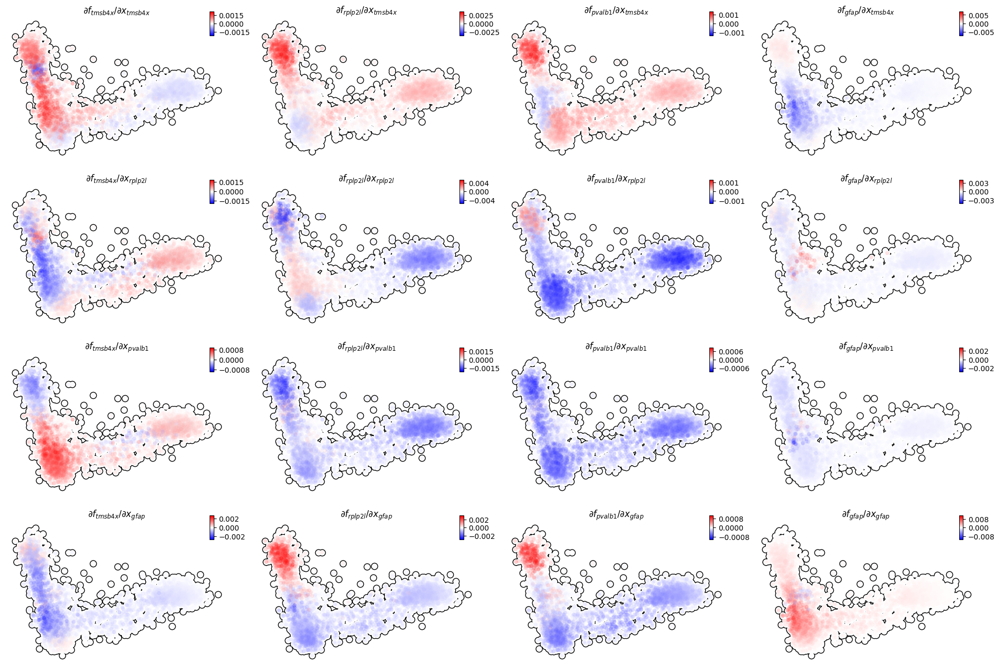

In [34]:
# dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca_corrected')
dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca')
dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca')

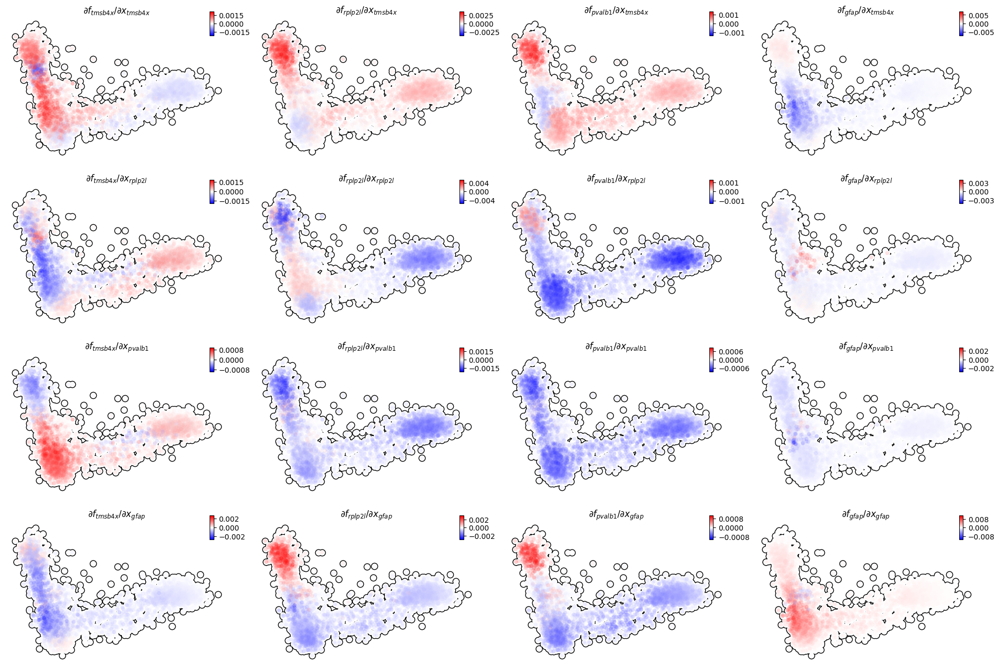

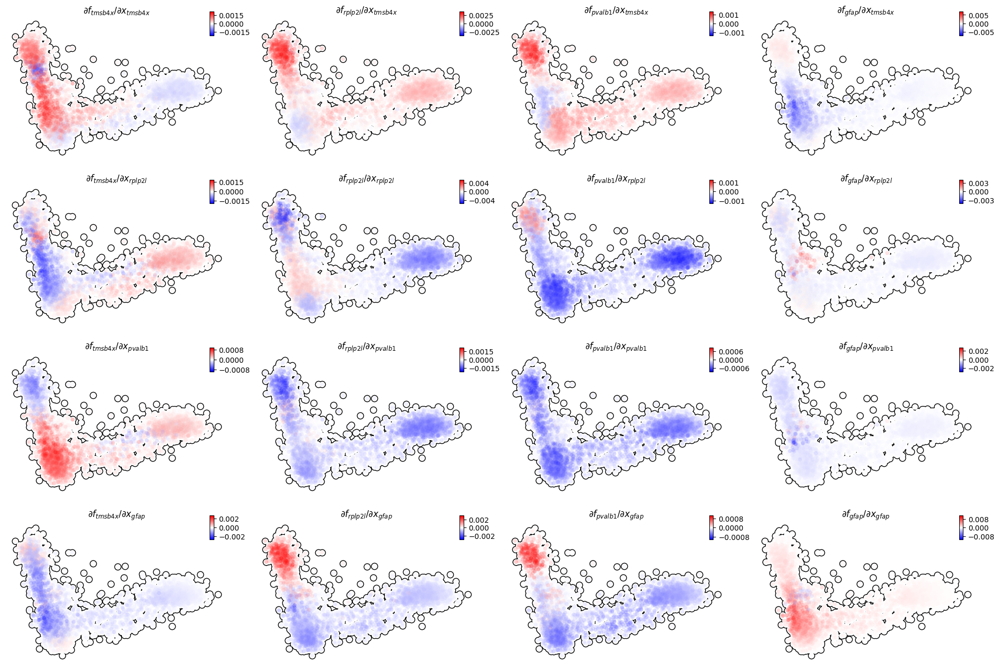

In [35]:
# dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca_corrected', layer='M_s')
dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca', layer='M_s')
dyn.pl.jacobian(adata, regulators=selected_genes[:4], effectors=selected_genes[:4], basis='pca', layer='M_s')


In [36]:
# print(dyn.ext.enrichr.get_library_name())
rank_abs_acceleration = adata.uns['rank_abs_acceleration']
enr = dyn.ext.enrichr(list(np.unique(rank_abs_acceleration.head(10).values)), 
                      organism='zebrafish', outdir='./enrichr', gene_sets='KEGG_2019', no_plot=True)
from gseapy.plot import barplot, dotplot

In [37]:
dyn.vf.rank_velocity_genes(adata)

AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'curvature_pca', 'acceleration_pca', 'jacobian_det_pca'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_m', 'score', 'log_cv', 'use_for_pca', 'frac', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition', 'top_pca_genes'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca', 'rank

In [38]:
rank_speed = adata.uns['rank_velocity_S']

rank_speed.head(5)

,all
0,rundc3aa
1,ntm
2,atp7a
3,zbtb46
4,KLHL


Select gene sets from https://amp.pharm.mssm.edu/modEnrichr


          Gene_set                      Term Overlap   P-value  \
0  Anatomy_AutoRIF               melanoblast    3/27  0.001060   
1  Anatomy_AutoRIF      mucus_secreting_cell     2/7  0.001145   
2  Anatomy_AutoRIF         spinal_nerve_root    2/22  0.011699   
3  Anatomy_AutoRIF              pigment_cell   8/183  0.000073   
4  Anatomy_AutoRIF  presumptive_rhombomere_2     1/9  0.065523   

   Adjusted P-value  Old P-value  Old Adjusted P-value   Z-score  \
0          0.069070     0.005465              0.329746 -2.942266   
1          0.069070     0.004959              0.329746 -2.093076   
2          0.254542     0.033867              0.659858 -3.037946   
3          0.013285     0.001822              0.329746 -1.407796   
4          0.329434     0.115639              0.659858 -4.418594   

   Combined Score                                          Genes  
0       20.153479                               pnp4a;sox10;oca2  
1       14.175406                                     sox10;

'Warning: No enrich terms when cutoff = 0.05'

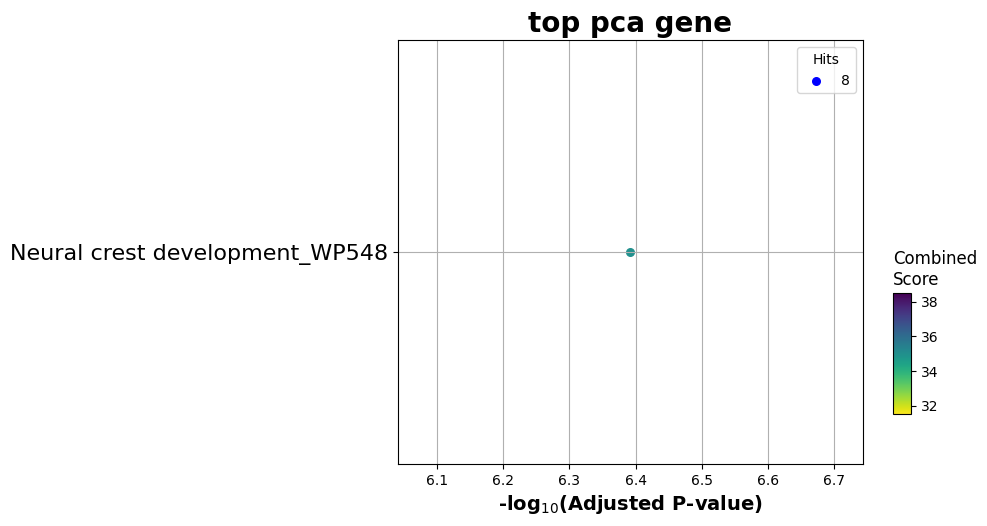

In [39]:
fish_gene_sets = [
"Anatomy_AutoRIF",
"Anatomy_AutoRIF_Predicted_Z-score"
"Anatomy_GeneRIF",
"Anatomy_GeneRIF_Predicted_Z-score",
"Coexpression_Predicted_GO_Biological_Process_2018",
"Coexpression_Predicted_GO_Cellular_Component_2018",
"Coexpression_Predicted_GO_Molecular_Function_2018",
"GO_Biological_Process_2018",
"GO_Biological_Process_AutoRIF",
"GO_Biological_Process_AutoRIF_Predicted_Z-score",
"GO_Biological_Process_GeneRIF",
"GO_Biological_Process_GeneRIF_Predicted_Z-score",
"GO_Cellular_Component_2018",
"GO_Cellular_Component_AutoRIF",
"GO_Cellular_Component_AutoRIF_Predicted_Z-score",
"GO_Cellular_Component_GeneRIF",
"GO_Cellular_Component_GeneRIF_Predicted_Z-score",
"GO_Molecular_Function_2018",
"GO_Molecular_Function_AutoRIF",
"GO_Molecular_Function_AutoRIF_Predicted_Z-score",
"GO_Molecular_Function_GeneRIF",
"GO_Molecular_Function_GeneRIF_Predicted_Z-score",
"InterPro_Domains_2019",
"KEGG_2019",
"Pfam_Domains_2019",
"Phenotype_AutoRIF",
"Phenotype_AutoRIF_Predicted_Z-score",
"Phenotype_GeneRIF",
"Phenotype_GeneRIF_Predicted_Z-score",
"WikiPathways_2018",
]
# enr = dyn.ext.enrichr(list(rank_speed['all'].head(150)), organism='Fish', outdir='./enrichr', gene_sets=fish_gene_sets, no_plot=True)
enr = dyn.ext.enrichr(list(top_pca_genes[:150]), organism='Fish', outdir='./enrichr', gene_sets=fish_gene_sets, no_plot=True)
print(enr.results.head(5))
dotplot(enr.res2d, title='top pca gene', cmap='viridis_r')

enr = dyn.ext.enrichr(list(rank_speed['all'].head(150)), organism='Fish', outdir='./enrichr', gene_sets=fish_gene_sets, no_plot=True)
print(enr.results.head(5))
dotplot(enr.res2d, title='top pca gene', cmap='viridis_r')

In [40]:
dyn.ext.ddhodge(adata, basis='pca')

/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
|-----> [graphize_vecfld] in progress: 100.0000%
|-----> [graphize_vecfld] finished [188.7744s]


<Figure size 600x400 with 0 Axes>

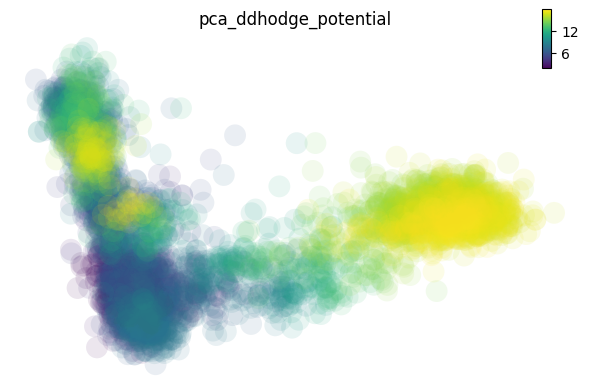

<Figure size 600x400 with 0 Axes>

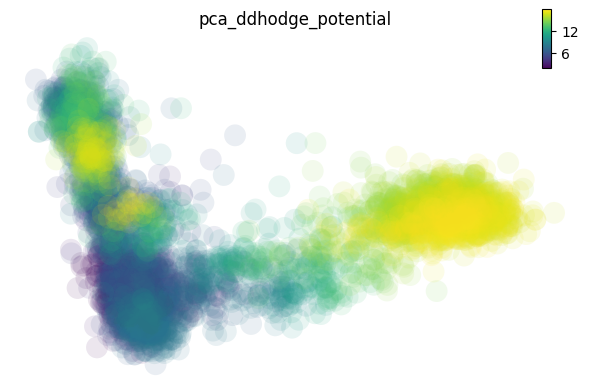

In [41]:
dyn.pl.scatters(adata, basis='pca', color='pca_ddhodge_potential')
dyn.pl.scatters(adata, basis='pca', color='pca_ddhodge_potential')

In [42]:
adata.obs.batch

index
TGCCAAATCACCACCT-1-0    0
AAATGCCAGGAGCGTT-1-0    0
CAGCGACAGAGAACAG-1-0    0
GGGACCTGTGACCAAG-1-0    0
TCCCGATAGTGTGGCA-1-0    0
                       ..
TAGACCAAGTCCATAC-1-1    1
GGTGTTAAGGAATCGC-1-1    1
CTACCCAAGTGACATA-1-1    1
TACTCATGTTACGCGC-1-1    1
TCAACGACACTCTGTC-1-1    1
Name: batch, Length: 4181, dtype: category
Categories (2, object): ['0', '1']

/Users/mashiro/anaconda3/envs/dynamo-dev/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


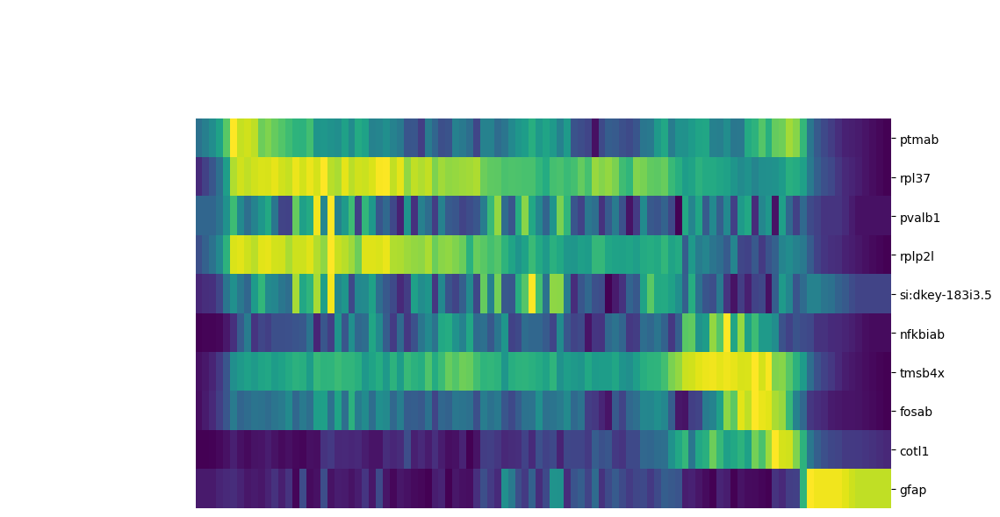

In [43]:
dyn.pl.kinetic_heatmap(adata[:, :], genes=selected_genes, tkey='pca_ddhodge_potential',
                       gene_order_method='maximum', mode='pseudotime', color_map='viridis')

### Build state graphs of cell types or clusters.

Index(['TGCCAAATCACCACCT-1-0', 'AAATGCCAGGAGCGTT-1-0', 'CAGCGACAGAGAACAG-1-0',
       'GGGACCTGTGACCAAG-1-0', 'TCCCGATAGTGTGGCA-1-0', 'CAGAGAGAGGCGATAC-1-0',
       'AACTGGTAGTGGAGAA-1-0', 'ATTGGACGTCTAGCGC-1-0', 'TGGGCGTCACCAGGTC-1-0',
       'TTGGCAAAGGGCTTCC-1-0',
       ...
       'TGGACGCTCAAACAAG-1-1', 'GGGCATCCATATGGTC-1-1', 'CCTAAAGCAGATCGGA-1-1',
       'AAACCTGGTGTGTGCC-1-1', 'CGGACACCACGAGAGT-1-1', 'TAGACCAAGTCCATAC-1-1',
       'GGTGTTAAGGAATCGC-1-1', 'CTACCCAAGTGACATA-1-1', 'TACTCATGTTACGCGC-1-1',
       'TCAACGACACTCTGTC-1-1'],
      dtype='object', name='index', length=4181)


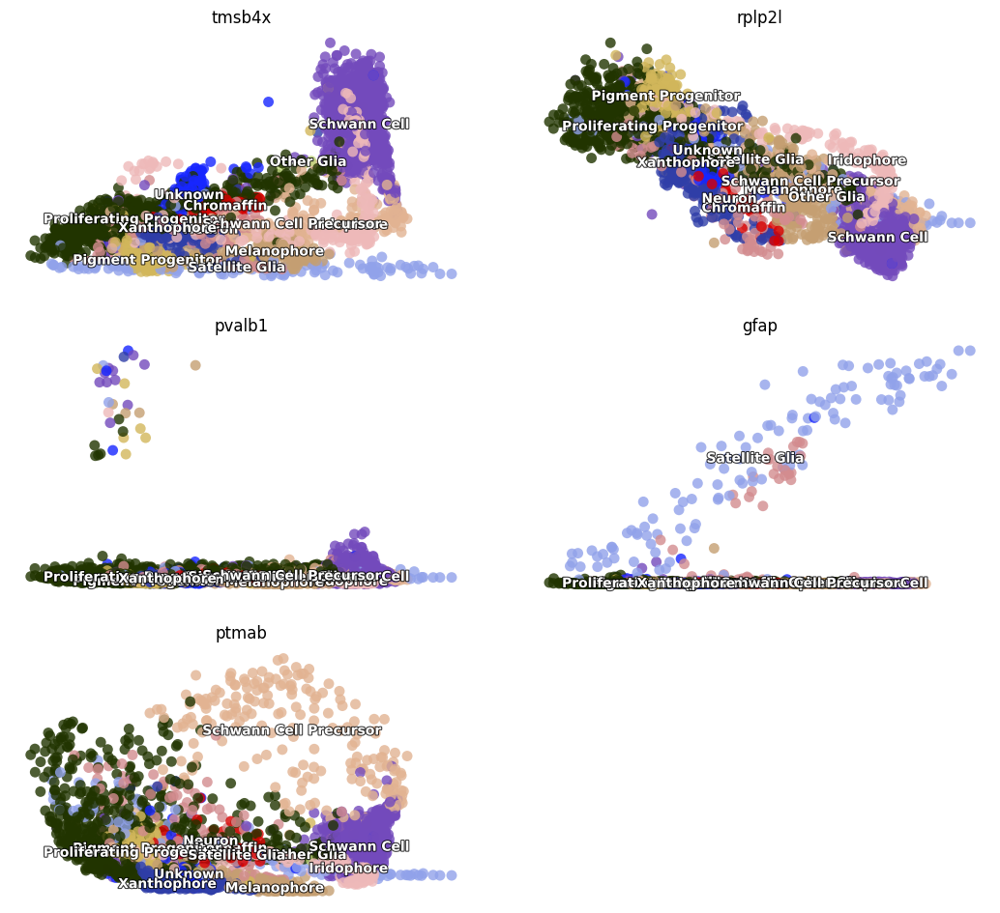

In [44]:
import numpy as np 
print(adata.obs.index)
dyn.pl.scatters(adata, x=np.repeat('pca_ddhodge_potential', 5), pointsize=0.25, alpha=0.8, 
                y=selected_genes, layer='M_s', color='Cell_type',
                ncols=2, background='white', figsize=(7, 4))

In [45]:
adata.obs['ClusterStr'] = adata.obs['Cluster'].astype(str)

In [46]:
%%capture 

dyn.pd.state_graph(adata, group='Cell_type', basis='pca', method='vf')
dyn.pd.state_graph(adata, group='ClusterStr', basis='pca', method='vf')

|-----> Estimating the transition probability between cell types...
|-----> Applying vector field

|-----> [KDTree parameter preparation computation] finished [1007.7319s]

|-----> [KDTree computation] finished [0.0024s]
|-----> [iterate groups] in progress: 100.0000%
|-----> [iterate groups] finished [111.6211s]
|-----> Estimating the transition probability between cell types...
|-----> Applying vector field

|-----> [KDTree parameter preparation computation] finished [112.9557s]

|-----> [KDTree computation] finished [0.0021s]
|-----> [iterate groups] in progress: 100.0000%
|-----> [iterate groups] finished [173.5660s]


/Users/mashiro/dynamo-release/dynamo/plot/state_graph.py:121: RuntimeWarning: invalid value encountered in true_divide
  Pl /= Pl.sum(1)[:, None]


<Figure size 640x480 with 0 Axes>

<Figure size 600x400 with 0 Axes>

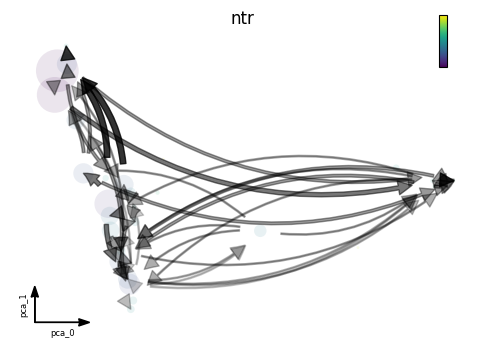

<Figure size 640x480 with 0 Axes>

In [47]:
dyn.pl.state_graph(adata, group='ClusterStr', basis='pca', method='vf')

/Users/mashiro/dynamo-release/dynamo/plot/state_graph.py:121: RuntimeWarning: invalid value encountered in true_divide
  Pl /= Pl.sum(1)[:, None]


<Figure size 640x480 with 0 Axes>

<Figure size 600x400 with 0 Axes>

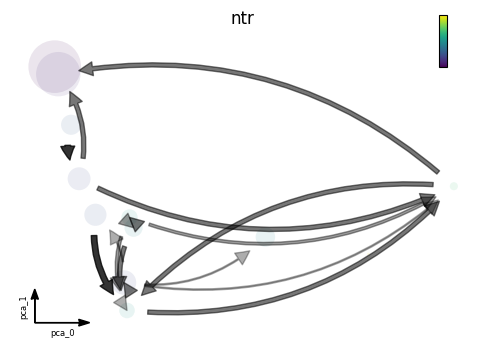

<Figure size 640x480 with 0 Axes>

In [48]:
dyn.pl.state_graph(adata, group='Cell_type', basis='pca', method='vf')